In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.preprocessing import StandardScaler

%matplotlib notebook

pd.options.display.max_columns = None

In [2]:
finaid = pd.read_csv("financial-aid.csv")
finaid

,UnitID,Institution Name,Institution name alias (HD2016),Street address or post office box (HD2016),City location of institution (HD2016),State abbreviation (HD2016),Total number of full-time first-time degree/certificate seeking undergraduates - financial aid cohort (SFA1516),Number of full-time first-time undergraduates awarded federal state local or institutional grant aid (SFA1516),Percent of full-time first-time undergraduates awarded federal state local or institutional grant aid (SFA1516),Total amount of federal state local or institutional grant aid awarded to full-time first-time undergraduates (SFA1516),Average amount of federal state local or institutional grant aid awarded (SFA1516),Number of full-time first-time undergraduates awarded Pell grants (SFA1516),Percent of full-time first-time undergraduates awarded Pell grants (SFA1516),Total amount of Pell grant aid awarded to full-time first-time undergraduates (SFA1516),Average amount of Pell grant aid awarded to full-time first-time undergraduates (SFA1516),Number of full-time first-time undergraduates awarded federal student loans (SFA1516),Percent of full-time first-time undergraduates awarded federal student loans (SFA1516),Total amount of federal student loans awarded to full-time first-time undergraduates (SFA1516),Average amount of federal student loans awarded to full-time first-time undergraduates (SFA1516),Total number of full-time first-time degree/certificate seeking undergraduates - financial aid cohort (SFA1415),Number of full-time first-time undergraduates awarded federal state local or institutional grant aid (SFA1415),Percent of full-time first-time undergraduates awarded federal state local or institutional grant aid (SFA1415),Total amount of federal state local or institutional grant aid awarded to full-time first-time undergraduates (SFA1415),Average amount of federal state local or institutional grant aid awarded (SFA1415),Number of full-time first-time undergraduates awarded Pell grants (SFA1415),Percent of full-time first-time undergraduates awarded Pell grants (SFA1415),Total amount of Pell grant aid awarded to full-time first-time undergraduates (SFA1415),Average amount of Pell grant aid awarded to full-time first-time undergraduates (SFA1415),Number of full-time first-time undergraduates awarded federal student loans (SFA1415),Percent of full-time first-time undergraduates awarded federal student loans (SFA1415),Total amount of federal student loans awarded to full-time first-time undergraduates (SFA1415),Average amount of federal student loans awarded to full-time first-time undergraduates (SFA1415),Total number of full-time first-time degree/certificate seeking undergraduates - financial aid cohort (SFA1314),Number of full-time first-time undergraduates awarded federal state local or institutional grant aid (SFA1314),Percent of full-time first-time undergraduates awarded federal state local or institutional grant aid (SFA1314),Total amount of federal state local or institutional grant aid awarded to full-time first-time undergraduates (SFA1314),Average amount of federal state local or institutional grant aid awarded (SFA1314),Number of full-time first-time undergraduates awarded Pell grants (SFA1314),Percent of full-time first-time undergraduates awarded Pell grants (SFA1314),Total amount of Pell grant aid awarded to full-time first-time undergraduates (SFA1314),Average amount of Pell grant aid awarded to full-time first-time undergraduates (SFA1314),Number of full-time first-time undergraduates awarded federal student loans (SFA1314),Percent of full-time first-time undergraduates awarded federal student loans (SFA1314),Total amount of federal student loans awarded to full-time first-time undergraduates (SFA1314),Average amount of federal student loans awarded to full-time first-time undergraduates (SFA1314),Total number of full-time first-time degree/certificate seeking undergraduates - financial aid cohort (SFA1213),Number of full-time 

In [3]:
finaid = finaid[['UnitID', 
       'Institution Name', 
       'City location of institution (HD2016)', 
       'State abbreviation (HD2016)',
        'Total amount of federal  state  local or institutional grant aid awarded to full-time first-time undergraduates (SFA1516)',
        'Average amount of federal  state  local or institutional grant aid awarded (SFA1516)',
        'Total amount of federal student loans awarded to full-time first-time undergraduates (SFA1516)',
        'Average amount of federal student loans awarded to full-time first-time undergraduates (SFA1516)',
        'Total amount of federal  state  local or institutional grant aid received by full-time first-time undergraduates (SFA0809)',
        'Average amount of federal  state  local or institutional grant aid received (SFA0809)',
        'Total amount of Federal student loan aid received by full-time first-time undergraduates (SFA0809)',
        'Average amount of federal student loan aid received by full-time first-time undergraduates (SFA0809)'
       ]]

In [4]:
cost = pd.read_csv("cost-attendance.csv")
cost

,UnitID,Institution Name,Institution name alias (HD2016),Street address or post office box (HD2016),City location of institution (HD2016),State abbreviation (HD2016),Published in-state tuition and fees 2017-18 (IC2017_AY),Total price for in-state students living on campus 2017-18 (DRVIC2017),Total price for out-of-state students living on campus 2017-18 (DRVIC2017),Total price for in-state students living off campus (not with family) 2017-18 (DRVIC2017),Total price for out-of-state students living off campus (not with family) 2017-18 (DRVIC2017),Total price for in-state students living off campus (with family) 2017-18 (DRVIC2017),Total price for out-of-state students living off campus (with family) 2017-18 (DRVIC2017),Published in-state tuition and fees 2016-17 (IC2016_AY),Total price for in-state students living on campus 2016-17 (DRVIC2016),Total price for out-of-state students living on campus 2016-17 (DRVIC2016),Total price for in-state students living off campus (not with family) 2016-17 (DRVIC2016),Total price for out-of-state students living off campus (not with family) 2016-17 (DRVIC2016),Total price for in-state students living off campus (with family) 2016-17 (DRVIC2016),Total price for out-of-state students living off campus (with family) 2016-17 (DRVIC2016),Published in-state tuition and fees 2015-16 (IC2015_AY),Total price for in-state students living on campus 2015-16 (DRVIC2015),Total price for out-of-state students living on campus 2015-16 (DRVIC2015),Total price for in-state students living off campus (not with family) 2015-16 (DRVIC2015),Total price for out-of-state students living off campus (not with family) 2015-16 (DRVIC2015),Total price for in-state students living off campus (with family) 2015-16 (DRVIC2015),Total price for out-of-state students living off campus (with family) 2015-16 (DRVIC2015),Published in-state tuition and fees 2014-15 (IC2014_AY),Total price for in-state students living on campus 2014-15 (DRVIC2014),Total price for out-of-state students living on campus 2014-15 (DRVIC2014),Total price for in-state students living off campus (not with family) 2014-15 (DRVIC2014),Total price for out-of-state students living off campus (not with family) 2014-15 (DRVIC2014),Total price for in-state students living off campus (with family) 2014-15 (DRVIC2014),Total price for out-of-state students living off campus (with family) 2014-15 (DRVIC2014),Published in-state tuition and fees 2013-14 (IC2013_AY),Total price for in-state students living on campus 2013-14 (DRVIC2013),Total price for out-of-state students living on campus 2013-14 (DRVIC2013),Total price for in-state students living off campus (not with family) 2013-14 (DRVIC2013),Total price for out-of-state students living off campus (not with family) 2013-14 (DRVIC2013),Total price for in-state students living off campus (with family) 2013-14 (DRVIC2013),Total price for out-of-state students living off campus (with family) 2013-14 (DRVIC2013),Published in-state tuition and fees 2012-13 (IC2012_AY),Total price for in-state students living on campus 2012-13 (DRVIC2012),Total price for out-of-state students living on campus 2012-13 (DRVIC2012),Total price for in-state students living off campus (not with family) 2012-13 (DRVIC2012),Total price for out-of-state students living off campus (not with family) 2012-13 (DRVIC2012),Total price for in-state students living off campus (with family) 2012-13 (DRVIC2012),Total price for out-of-state students living off campus (with family) 2012-13 (DRVIC2012),Published in-state tuition and fees 2011-12 (IC2011_AY),Total price for in-state students living on campus 2011-12 (DRVIC2011),Total price for out-of-state students living on campus 2011-12 (DRVIC2011),Total price for in-state students living off campus (not with family) 2011-12 (DRVIC2011),Total price for out-of-state students living off campus (not with family) 2011-12 (DRVIC2011),Total price for in-state students living off campus (with family) 2011-12 (D

In [5]:
cost = cost[['UnitID',
     'Published in-state tuition and fees 2017-18 (IC2017_AY)',
     'Total price for in-state students living off campus (not with family)  2017-18 (DRVIC2017)',
      'Total price for in-state students living off campus (not with family)  2008-09 (DRVIC2008)',
     ]]

In [6]:
retention = pd.read_csv("retention-rates.csv")
retention

,UnitID,Institution Name,Institution name alias (HD2016),Street address or post office box (HD2016),City location of institution (HD2016),State abbreviation (HD2016),Full-time retention rate 2016 (EF2016D),Part-time retention rate 2016 (EF2016D),Full-time retention rate 2015 (EF2015D),Part-time retention rate 2015 (EF2015D),Full-time retention rate 2014 (EF2014D),Part-time retention rate 2014 (EF2014D),Full-time retention rate 2013 (EF2013D),Part-time retention rate 2013 (EF2013D),Full-time retention rate 2012 (EF2012D),Part-time retention rate 2012 (EF2012D),Full-time retention rate 2011 (EF2011D),Part-time retention rate 2011 (EF2011D),Full-time retention rate 2010 (EF2010D),Part-time retention rate 2010 (EF2010D),Full-time retention rate 2009 (EF2009D),Part-time retention rate 2009 (EF2009D),Full-time retention rate 2008 (EF2008D),Part-time retention rate 2008 (EF2008D)
0,180203,Aaniiih Nakoda College,,269 Blackfeet Avenue Agency,Harlem,MT,63.0,100.0,48.0,0.0,42.0,0.0,54.0,67.0,52.0,100.0,65.0,60.0,50.0,NaN,48.0,NaN,57.0,50.0
1,222178,Abilene Christian University,,,Abilene,TX,76.0,33.0,79.0,NaN,75.0,50.0,79.0,NaN,75.0,0.0,75.0,NaN,71.0,0.0,75.0,NaN,75.0,67.0
2,138558,Abraham Baldwin Agricultural College,ABAC,2802 Moore Hwy,Tifton,GA,64.0,50.0,61.0,50.0,59.0,17.0,60.0,17.0,53.0,20.0,50.0,50.0,68.0,0.0,67.0,0.0,55.0,39.0
3,488031,Abraham Lincoln University,,3530 Wilshire Boulevard Suite 1430,Los Angeles,CA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,172866,Academy College,,1600 W. 82nd Street Suite 100,Bloomington,MN,100.0,NaN,NaN,NaN,NaN,NaN,NaN,100.0,100.0,NaN,NaN,NaN,NaN,NaN,100.0,NaN,NaN,NaN
5,412173,Academy for Nursing and Health Occupations,ANHO,5154 Okeechobee Blvd Ste 201,West Palm Beach,FL,100.0,NaN,75.0,NaN,86.0,NaN,95.0,NaN,86.0,NaN,86.0,NaN,88.0,NaN,94.0,NaN,81.0,NaN
6,108232,Academy of Art University,,79 New Montgomery,San Francisco,CA,71.0,37.0,76.0,43.0,76.0,48.0,71.0,41.0,72.0,36.0,65.0,32.0,63.0,37.0,57.0,32.0,60.0,36.0
7,439969,Acupuncture and Massage College,,10506 N Kendall Drive,Miami,FL,83.0,NaN,42.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.0,NaN,85.0,NaN
8,126182,Adams State University,,208 Edgemont Blvd,Alamosa,CO,61.0,100.0,53.0,17.0,58.0,25.0,56.0,31.0,59.0,43.0,54.0,20.0,62.0,67.0,58.0,30.0,49.0,28.0
9,188429,Adelphi University,,South Ave,Garden City,NY,83.0,29.0,84.0,52.0,83.0,53.0,81.0,33.0,82.0,56.0,81.0,58.0,82.0,75.0,79.0,70.0,78.0,9.0


In [7]:
retention = retention[['UnitID',
          'Full-time retention rate  2016 (EF2016D)']]

In [8]:
gradrates = pd.read_csv("grad-rates.csv")
gradrates

,UnitID,Institution Name,Institution name alias (HD2016),Street address or post office box (HD2016),City location of institution (HD2016),State abbreviation (HD2016),Grand total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),American Indian or Alaska Native total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),Asian total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),Black or African American total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),Hispanic total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),Native Hawaiian or Other Pacific Islander total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),White total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),Race/ethnicity unknown total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),Two or more races total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),Nonresident alien total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),Grand total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Adjusted cohort (revised cohort minus exclusions)),American Indian or Alaska Native total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Adjusted cohort (revised cohort minus exclusions)),Asian total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Adjusted cohort (revised cohort minus exclusions)),Black or African American total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Adjusted cohort (revised cohort minus exclusions)),Hispanic total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Adjusted cohort (revised cohort minus exclusions)),Native Hawaiian or Other Pacific Islander total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Adjusted cohort (revised cohort minus exclusions)),White total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Adjusted cohort (revised cohort minus exclusions)),Race/ethnicity unknown total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Adjusted cohort (revised cohort minus exclusions)),Two or more races total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Adjusted cohort (revised cohort minus exclusions)),Nonresident alien total (GR2016 Bachelor's or equiv subcohort (4-yr institution) Adjusted cohort (revised cohort minus exclusions)),Grand total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),American Indian or Alaska Native total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),Asian total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),Black or African American total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),Hispanic total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),Native Hawaiian or Other Pacific Islander total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),White total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),Race/ethnicity unknown total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),Two or more races total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),Nonresident alien total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),Grand total (GR2015 Bachelor's or equiv subcohort (4-yr institution) Completers within 150% of normal time total),American Indian or Alaska Nat

In [9]:
gradrates = gradrates[['UnitID',
          'Grand total (GR2016  Bachelor\'s or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE)']]

In [10]:
default = pd.read_csv("MERGED2012_13_PP.csv")
default

/Users/tedcarlson/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3057: DtypeWarning: Columns (1537,1540,1542,1575,1606,1614,1615,1729,1909,1910,1911,1912,1913) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


UNITID     OPEID  OPEID6  \
0       100654    100200    1002   
1       100663    105200    1052   
2       100690   2503400   25034   
3       100706    105500    1055   
4       100724    100500    1005   
5       100751    105100    1051   
6       100760    100700    1007   
7       100812    100800    1008   
8       100830    831000    8310   
9       100858    100900    1009   
10      100937    101200    1012   
11      101028   1218200   12182   
12      101073   1055400   10554   
13      101116   1303906   13039   
14      101143    101500    1015   
15      101161    106000    1060   
16      101189    100300    1003   
17      101240    101700    1017   
18      101277   4187200   41872   
19      101286    101800    1018   
20      101295    787100    7871   
21      101301    569900    5699   
22      101365    962107    9621   
23      101435    101900    1019   
24      101453   2199700   21997   
25      101462    526000    5260   
26      101480    102000    1020   
27      101499    102100    1021   
28      101505    102200    1022   
29      101514    101300    1013   
...        ...       ...     ...   
7763  45666705    145996    1459   
7764  45775801   4149301   41493   
7765  45775802   4149302   41493   
7766  45891901    145940    1459   
7767  45891902    145946    1459   
7768  45891903    145952    1459   
7769  45891904    145959    1459   
7770  45891905    145965    1459   
7771  45891906    145971    1459   
7772  45891907    145972    1459   
7773  45891908    145996    1459   
7774  45896401    145945    1459   
7775  45896402    145954    1459   
7776  45897301    145990    1459   
7777  45897302    145992    1459   
7778  45897303    145994    1459   
7779  45897304    145995    1459   
7780  45920401   4169701   41697   
7781  46163401   4176201   41762   
7782  46163402   4176202   41762   
7783  46163403   4176205   41762   
7784  46163404   4176206   41762   
7785  47647001   4088301   40883   
7786  47657701   4184801   41848   
7787  47657702   4184802   41848   
7788  47691101   4205801   42058   
7789  47701101  10145905    1459   
7790  47702001  10145903    1459   
7791  47702002  10145902    1459   
7792  47702003  10145906    1459   

                                                 INSTNM              CITY  \
0                              Alabama A & M University            Normal   
1                   University of Alabama at Birmingham        Birmingham   
2                                    Amridge University        Montgomery   
3                   University of Alabama in Huntsville        Huntsville   
4                              Alabama State University        Montgomery   
5                             The University of Alabama        Tuscaloosa   
6                     Central Alabama Community College    Alexander City   
7                               Athens State University            Athens   
8                       Auburn University at Montgomery        Montgomery   
9                                     Auburn University            Auburn   
10                          Birmingham Southern College        Birmingham   
11               Chattahoochee Valley Community College       Phenix City   
12                            Concordia College Alabama             Selma   
13                          South University-Montgomery        Montgomery   
14                   Enterprise State Community College        Enterprise   
15                    Coastal Alabama Community College       Bay Minette   
16                                  Faulkner University        Montgomery   
17                      Gadsden State Community College           Gadsden   
18                 New Beginning College of Cosmetology       Albertville   
19            George C Wallace Community College-Dothan            Dothan   
20    George C Wallace State Community College-Hance...        Hanceville   
21       George C Wallace State Community College-Selma             Selma   
22  

In [11]:
default = default[['UNITID','RPY_1YR_RT','RPY_3YR_RT','CDR2','CDR3']]

In [12]:
scorecard = pd.read_csv("Most-Recent-Cohorts-Scorecard-Elements.csv")
scorecard

,UNITID,OPEID,OPEID6,INSTNM,CITY,STABBR,INSTURL,NPCURL,HCM2,PREDDEG,HIGHDEG,CONTROL,LOCALE,HBCU,PBI,ANNHI,TRIBAL,AANAPII,HSI,NANTI,MENONLY,WOMENONLY,RELAFFIL,SATVR25,SATVR75,SATMT25,SATMT75,SATWR25,SATWR75,SATVRMID,SATMTMID,SATWRMID,ACTCM25,ACTCM75,ACTEN25,ACTEN75,ACTMT25,ACTMT75,ACTWR25,ACTWR75,ACTCMMID,ACTENMID,ACTMTMID,ACTWRMID,SAT_AVG,SAT_AVG_ALL,PCIP01,PCIP03,PCIP04,PCIP05,PCIP09,PCIP10,PCIP11,PCIP12,PCIP13,PCIP14,PCIP15,PCIP16,PCIP19,PCIP22,PCIP23,PCIP24,PCIP25,PCIP26,PCIP27,PCIP29,PCIP30,PCIP31,PCIP38,PCIP39,PCIP40,PCIP41,PCIP42,PCIP43,PCIP44,PCIP45,PCIP46,PCIP47,PCIP48,PCIP49,PCIP50,PCIP51,PCIP52,PCIP54,DISTANCEONLY,UGDS,UGDS_WHITE,UGDS_BLACK,UGDS_HISP,UGDS_ASIAN,UGDS_AIAN,UGDS_NHPI,UGDS_2MOR,UGDS_NRA,UGDS_UNKN,PPTUG_EF,CURROPER,NPT4_PUB,NPT4_PRIV,NPT41_PUB,NPT42_PUB,NPT43_PUB,NPT44_PUB,NPT45_PUB,NPT41_PRIV,NPT42_PRIV,NPT43_PRIV,NPT44_PRIV,NPT45_PRIV,PCTPELL,RET_FT4_POOLED_SUPP,RET_FTL4_POOLED_SUPP,RET_PT4_POOLED_SUPP,RET_PTL4_POOLED_SUPP,PCTFLOAN,UG25ABV,MD_EARN_WNE_P10,GRAD_DEBT_MDN_SUPP,GRAD_DEBT_MDN10YR_SUPP,RPY_3YR_RT_SUPP,C150_L4_POOLED_SUPP,C150_4_POOLED_SUPP,OMAWDP8_FTFT_POOLED_SUPP,OMENRYP8_FTFT_POOLED_SUPP,OMENRAP8_FTFT_POOLED_SUPP,OMENRUP8_FTFT_POOLED_SUPP,OMAWDP8_PTFT_POOLED_SUPP,OMENRYP8_PTFT_POOLED_SUPP,OMENRAP8_PTFT_POOLED_SUPP,OMENRUP8_PTFT_POOLED_SUPP,OMAWDP8_FTNFT_POOLED_SUPP,OMENRYP8_FTNFT_POOLED_SUPP,OMENRAP8_FTNFT_POOLED_SUPP,OMENRUP8_FTNFT_POOLED_SUPP,OMAWDP8_PTNFT_POOLED_SUPP,OMENRYP8_PTNFT_POOLED_SUPP,OMENRAP8_PTNFT_POOLED_SUPP,OMENRUP8_PTNFT_POOLED_SUPP,OPEFLAG,PRGMOFR,CIPCODE1,CIPCODE2,CIPCODE3,CIPCODE4,CIPCODE5,CIPCODE6,CIPTITLE1,CIPTITLE2,CIPTITLE3,CIPTITLE4,CIPTITLE5,CIPTITLE6,CIPTFBS1,CIPTFBS2,CIPTFBS3,CIPTFBS4,CIPTFBS5,CIPTFBS6,CIPTFBSANNUAL1,CIPTFBSANNUAL2,CIPTFBSANNUAL3,CIPTFBSANNUAL4,CIPTFBSANNUAL5,CIPTFBSANNUAL6,MTHCMP1,MTHCMP2,MTHCMP3,MTHCMP4,MTHCMP5,MTHCMP6,OMENRYP_ALL_POOLED_SUPP,OMENRAP_ALL_POOLED_SUPP,OMAWDP8_ALL_POOLED_SUPP,OMENRUP_ALL_POOLED_SUPP,OMENRYP_FIRSTTIME_POOLED_SUPP,OMENRAP_FIRSTTIME_POOLED_SUPP,OMAWDP8_FIRSTTIME_POOLED_SUPP,OMENRUP_FIRSTTIME_POOLED_SUPP,OMENRYP_NOTFIRSTTIME_POOLED_SUPP,OMENRAP_NOTFIRSTTIME_POOLED_SUPP,OMAWDP8_NOTFIRSTTIME_POOLED_SUPP,OMENRUP_NOTFIRSTTIME_POOLED_SUPP,OMENRYP_FULLTIME_POOLED_SUPP,OMENRAP_FULLTIME_POOLED_SUPP,OMAWDP8_FULLTIME_POOLED_SUPP,OMENRUP_FULLTIME_POOLED_SUPP,OMENRYP_PARTTIME_POOLED_SUPP,OMENRAP_PARTTIME_POOLED_SUPP,OMAWDP8_PARTTIME_POOLED_SUPP,OMENRUP_PARTTIME_POOLED_SUPP
0,100654,100200,1002,Alabama A & M University,Normal,AL,www.aamu.edu/,https://galileo.aamu.edu/NetPriceCalculator/np...,0,3,4,1,12.0,1.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,NaN,365.0,485.0,360.0,495.0,370.0,457.0,425.0,428.0,414.0,16.0,19.0,14.0,20.0,15.0,18.0,NaN,NaN,18.0,17.0,17.0,NaN,929.0,929.0,0.0375,0.0177,0.0088,0.0000,0.0000,0.0442,0.0353,0.0000,0.1192,0.0751,0.0287,0.0000,0.0199,0.0000,0.0132,0.0618,0.0,0.0949,0.0000,0.0,0.0000,0.0000,0.0000,0.0000,0.0353,0.0000,0.0574,0.0552,0.0751,0.0243,0.0000,0.0000,0.0000,0.0000,0.0265,0.0000,0.1700,0.0000,0.0,4824.0,0.0253,0.9073,0.0091,0.0019,0.0021,0.0019,0.0104,0.0089,0.0332,0.0655,1,15184.0,NaN,14719.0,14447.0,16746.0,17127.0,18956.0,NaN,NaN,NaN,NaN,NaN,0.7100,0.5828,NaN,0.2759,NaN,0.7697,0.0758,31000,32750,348.16551225731,0.2531554273,NaN,0.2594,0.3596,0.0145,0.3212,0.3048,0.1493,0.0746,0.5224,0.2537,0.4585,0.0098,0.2829,0.2488,0.3,0.0143,0.3905,0.2952,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0152,0.3255,0.3645,0.2947,0.0163,0.3273,0.3532,0.3032,0.0113,0.3194,0.4048,0.2645,0.0137,0.315,0.3755,0.2958,0.0289,0.4224,0.2635,0.2852
1,100663,105200,1052,University of Alabama at Birmingham,Birmingham,AL,www.uab.edu,uab.studentaidcalculator.com/survey.aspx,0,3,4,1,12.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,NaN,440.0,630.0,550.0,740.0,NaN,NaN,535.0,645.0,NaN,21.0,28.0,22.0,31.0,21.0,26.0,NaN,NaN,25.0,27.0,24.0,NaN,1195.0,1195.0,0.0000,0.0000,0.0000,0.0021,0.0349,0.0000,0.0141,0.0000,0.0665,0.0698,0.0000,0.0025,0.0000,0.0000,0.0174,0.0187,0.0

In [13]:
scorecard = scorecard[['UNITID',
           'UGDS',
           'NPT4_PUB',
           'NPT4_PRIV',
           'GRAD_DEBT_MDN_SUPP',
           'MD_EARN_WNE_P10',
           'PCTFLOAN',
          ]]

In [14]:
merge = pd.merge(finaid, scorecard, left_on="UnitID", right_on='UNITID')
merge = pd.merge(merge, default, left_on="UnitID", right_on='UNITID')
merge = pd.merge(merge, retention, on="UnitID")
merge = pd.merge(merge, cost, on="UnitID")
sc = pd.merge(merge, gradrates, on="UnitID")

In [15]:
sc

,UnitID,Institution Name,City location of institution (HD2016),State abbreviation (HD2016),Total amount of federal state local or institutional grant aid awarded to full-time first-time undergraduates (SFA1516),Average amount of federal state local or institutional grant aid awarded (SFA1516),Total amount of federal student loans awarded to full-time first-time undergraduates (SFA1516),Average amount of federal student loans awarded to full-time first-time undergraduates (SFA1516),Total amount of federal state local or institutional grant aid received by full-time first-time undergraduates (SFA0809),Average amount of federal state local or institutional grant aid received (SFA0809),Total amount of Federal student loan aid received by full-time first-time undergraduates (SFA0809),Average amount of federal student loan aid received by full-time first-time undergraduates (SFA0809),UNITID_x,UGDS,NPT4_PUB,NPT4_PRIV,GRAD_DEBT_MDN_SUPP,MD_EARN_WNE_P10,PCTFLOAN,UNITID_y,RPY_1YR_RT,RPY_3YR_RT,CDR2,CDR3,Full-time retention rate 2016 (EF2016D),Published in-state tuition and fees 2017-18 (IC2017_AY),Total price for in-state students living off campus (not with family) 2017-18 (DRVIC2017),Total price for in-state students living off campus (not with family) 2008-09 (DRVIC2008),Grand total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE)
0,180203,Aaniiih Nakoda College,Harlem,MT,144058.0,5762.0,0.0,NaN,276001.0,6900.0,0.0,NaN,180203,122.0,8311.0,NaN,PrivacySuppressed,20300,0.0000,180203,NaN,NaN,0.000,0.000,63.0,2410.0,17030.0,17900.0,NaN
1,222178,Abilene Christian University,Abilene,TX,18761445.0,17550.0,3414378.0,5758.0,8673739.0,9267.0,4575973.0,7717.0,222178,3655.0,NaN,26037.0,23628,43000,0.5266,222178,0.6505410567,0.693627451,0.050,0.085,76.0,33330.0,48300.0,NaN,62.5
2,138558,Abraham Baldwin Agricultural College,Tifton,GA,3731762.0,4790.0,2356007.0,4919.0,3592674.0,4232.0,2533538.0,4500.0,138558,3185.0,8251.0,NaN,14681.5,32900,0.4184,138558,0.3493506494,0.4206349206,0.093,0.179,64.0,3503.0,13803.0,13791.0,31.7
3,172866,Academy College,Bloomington,MN,19354.0,9677.0,24500.0,8167.0,44470.0,2965.0,82167.0,5478.0,172866,56.0,NaN,NaN,24216,33500,0.5000,172866,0.2943925234,0.4135802469,0.198,0.277,100.0,17661.0,36902.0,33108.0,NaN
4,412173,Academy for Nursing and Health Occupations,West Palm Beach,FL,114041.0,4224.0,195376.0,7236.0,1678826.0,4115.0,2488200.0,7800.0,412173,408.0,NaN,20571.0,14853,38500,0.5744,412173,0.1538461538,0.2251308901,0.039,0.038,100.0,NaN,NaN,NaN,NaN
5,108232,Academy of Art University,San Francisco,CA,1733856.0,8417.0,1505344.0,5702.0,1539018.0,5988.0,2595466.0,5351.0,108232,7520.0,NaN,33012.0,35688,38600,0.4718,108232,0.2842558622,0.3836150845,0.109,0.140,71.0,21252.0,40750.0,34696.0,37.2
6,439969,Acupuncture and Massage College,Miami,FL,31478.0,3935.0,47989.0,6856.0,96669.0,3718.0,413635.0,10606.0,439969,37.0,NaN,20324.0,7600,24500,0.6429,439969,0.3739837398,0.4329896907,0.029,0.193,83.0,10765.0,37991.0,29940.0,NaN
7,126182,Adams State University,Alamosa,CO,3077721.0,7562.0,1520090.0,5915.0,2538880.0,6238.0,1351979.0,4989.0,126182,1876.0,13742.0,NaN,22500,35200,0.5539,126182,0.3872714963,0.4125932063,0.072,0.157,61.0,9440.0,24597.0,NaN,28.8
8,188429,Adelphi University,Garden City,NY,15296967.0,19487.0,3031523.0,6149.0,10197524.0,12125.0,2150365.0,3525.0,188429,5162.0,NaN,28322.0,25000,58500,0.5841,188429,0.6380813953,0.6921578178,0.033,0.059,83.0,37170.0,56358.0,36240.0,68.2
9,188438,Adirondack Community College,Queensbury,NY,3056976.0,5086.0,1788850.0,4888.0,1705723.0,3325.0,1019930.0,4322.0,188438,3034.0,7642.0,NaN,12000,31900,0.5379,188438,0.4077901431,0.462657614,0.111,0.198,60.0,5119.0,20394.0,13452.0,NaN


In [16]:
sc['net cost'] = np.where(sc['NPT4_PUB']>0, sc['NPT4_PUB'], sc['NPT4_PRIV'])
sc = sc.drop(['NPT4_PUB','NPT4_PRIV'],axis=1)

In [17]:
sc = sc.fillna(0)
sc

,UnitID,Institution Name,City location of institution (HD2016),State abbreviation (HD2016),Total amount of federal state local or institutional grant aid awarded to full-time first-time undergraduates (SFA1516),Average amount of federal state local or institutional grant aid awarded (SFA1516),Total amount of federal student loans awarded to full-time first-time undergraduates (SFA1516),Average amount of federal student loans awarded to full-time first-time undergraduates (SFA1516),Total amount of federal state local or institutional grant aid received by full-time first-time undergraduates (SFA0809),Average amount of federal state local or institutional grant aid received (SFA0809),Total amount of Federal student loan aid received by full-time first-time undergraduates (SFA0809),Average amount of federal student loan aid received by full-time first-time undergraduates (SFA0809),UNITID_x,UGDS,GRAD_DEBT_MDN_SUPP,MD_EARN_WNE_P10,PCTFLOAN,UNITID_y,RPY_1YR_RT,RPY_3YR_RT,CDR2,CDR3,Full-time retention rate 2016 (EF2016D),Published in-state tuition and fees 2017-18 (IC2017_AY),Total price for in-state students living off campus (not with family) 2017-18 (DRVIC2017),Total price for in-state students living off campus (not with family) 2008-09 (DRVIC2008),Grand total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),net cost
0,180203,Aaniiih Nakoda College,Harlem,MT,144058.0,5762.0,0.0,0.0,276001.0,6900.0,0.0,0.0,180203,122.0,PrivacySuppressed,20300,0.0000,180203,0,0,0.000,0.000,63.0,2410.0,17030.0,17900.0,0.0,8311.0
1,222178,Abilene Christian University,Abilene,TX,18761445.0,17550.0,3414378.0,5758.0,8673739.0,9267.0,4575973.0,7717.0,222178,3655.0,23628,43000,0.5266,222178,0.6505410567,0.693627451,0.050,0.085,76.0,33330.0,48300.0,0.0,62.5,26037.0
2,138558,Abraham Baldwin Agricultural College,Tifton,GA,3731762.0,4790.0,2356007.0,4919.0,3592674.0,4232.0,2533538.0,4500.0,138558,3185.0,14681.5,32900,0.4184,138558,0.3493506494,0.4206349206,0.093,0.179,64.0,3503.0,13803.0,13791.0,31.7,8251.0
3,172866,Academy College,Bloomington,MN,19354.0,9677.0,24500.0,8167.0,44470.0,2965.0,82167.0,5478.0,172866,56.0,24216,33500,0.5000,172866,0.2943925234,0.4135802469,0.198,0.277,100.0,17661.0,36902.0,33108.0,0.0,0.0
4,412173,Academy for Nursing and Health Occupations,West Palm Beach,FL,114041.0,4224.0,195376.0,7236.0,1678826.0,4115.0,2488200.0,7800.0,412173,408.0,14853,38500,0.5744,412173,0.1538461538,0.2251308901,0.039,0.038,100.0,0.0,0.0,0.0,0.0,20571.0
5,108232,Academy of Art University,San Francisco,CA,1733856.0,8417.0,1505344.0,5702.0,1539018.0,5988.0,2595466.0,5351.0,108232,7520.0,35688,38600,0.4718,108232,0.2842558622,0.3836150845,0.109,0.140,71.0,21252.0,40750.0,34696.0,37.2,33012.0
6,439969,Acupuncture and Massage College,Miami,FL,31478.0,3935.0,47989.0,6856.0,96669.0,3718.0,413635.0,10606.0,439969,37.0,7600,24500,0.6429,439969,0.3739837398,0.4329896907,0.029,0.193,83.0,10765.0,37991.0,29940.0,0.0,20324.0
7,126182,Adams State University,Alamosa,CO,3077721.0,7562.0,1520090.0,5915.0,2538880.0,6238.0,1351979.0,4989.0,126182,1876.0,22500,35200,0.5539,126182,0.3872714963,0.4125932063,0.072,0.157,61.0,9440.0,24597.0,0.0,28.8,13742.0
8,188429,Adelphi University,Garden City,NY,15296967.0,19487.0,3031523.0,6149.0,10197524.0,12125.0,2150365.0,3525.0,188429,5162.0,25000,58500,0.5841,188429,0.6380813953,0.6921578178,0.033,0.059,83.0,37170.0,56358.0,36240.0,68.2,28322.0
9,188438,Adirondack Community College,Queensbury,NY,3056976.0,5086.0,1788850.0,4888.0,1705723.0,3325.0,1019930.0,4322.0,188438,3034.0,12000,31900,0.5379,188438,0.4077901431,0.462657614,0.111,0.198,60.0,5119.0,20394.0,13452.0,0.0,7642.0


In [18]:
sc = sc[sc['GRAD_DEBT_MDN_SUPP'] != "PrivacySuppressed"]
sc = sc[sc['MD_EARN_WNE_P10'] != "PrivacySuppressed"]
sc

,UnitID,Institution Name,City location of institution (HD2016),State abbreviation (HD2016),Total amount of federal state local or institutional grant aid awarded to full-time first-time undergraduates (SFA1516),Average amount of federal state local or institutional grant aid awarded (SFA1516),Total amount of federal student loans awarded to full-time first-time undergraduates (SFA1516),Average amount of federal student loans awarded to full-time first-time undergraduates (SFA1516),Total amount of federal state local or institutional grant aid received by full-time first-time undergraduates (SFA0809),Average amount of federal state local or institutional grant aid received (SFA0809),Total amount of Federal student loan aid received by full-time first-time undergraduates (SFA0809),Average amount of federal student loan aid received by full-time first-time undergraduates (SFA0809),UNITID_x,UGDS,GRAD_DEBT_MDN_SUPP,MD_EARN_WNE_P10,PCTFLOAN,UNITID_y,RPY_1YR_RT,RPY_3YR_RT,CDR2,CDR3,Full-time retention rate 2016 (EF2016D),Published in-state tuition and fees 2017-18 (IC2017_AY),Total price for in-state students living off campus (not with family) 2017-18 (DRVIC2017),Total price for in-state students living off campus (not with family) 2008-09 (DRVIC2008),Grand total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),net cost
1,222178,Abilene Christian University,Abilene,TX,18761445.0,17550.0,3414378.0,5758.0,8673739.0,9267.0,4575973.0,7717.0,222178,3655.0,23628,43000,0.5266,222178,0.6505410567,0.693627451,0.050,0.085,76.0,33330.0,48300.0,0.0,62.5,26037.0
2,138558,Abraham Baldwin Agricultural College,Tifton,GA,3731762.0,4790.0,2356007.0,4919.0,3592674.0,4232.0,2533538.0,4500.0,138558,3185.0,14681.5,32900,0.4184,138558,0.3493506494,0.4206349206,0.093,0.179,64.0,3503.0,13803.0,13791.0,31.7,8251.0
3,172866,Academy College,Bloomington,MN,19354.0,9677.0,24500.0,8167.0,44470.0,2965.0,82167.0,5478.0,172866,56.0,24216,33500,0.5000,172866,0.2943925234,0.4135802469,0.198,0.277,100.0,17661.0,36902.0,33108.0,0.0,0.0
4,412173,Academy for Nursing and Health Occupations,West Palm Beach,FL,114041.0,4224.0,195376.0,7236.0,1678826.0,4115.0,2488200.0,7800.0,412173,408.0,14853,38500,0.5744,412173,0.1538461538,0.2251308901,0.039,0.038,100.0,0.0,0.0,0.0,0.0,20571.0
5,108232,Academy of Art University,San Francisco,CA,1733856.0,8417.0,1505344.0,5702.0,1539018.0,5988.0,2595466.0,5351.0,108232,7520.0,35688,38600,0.4718,108232,0.2842558622,0.3836150845,0.109,0.140,71.0,21252.0,40750.0,34696.0,37.2,33012.0
6,439969,Acupuncture and Massage College,Miami,FL,31478.0,3935.0,47989.0,6856.0,96669.0,3718.0,413635.0,10606.0,439969,37.0,7600,24500,0.6429,439969,0.3739837398,0.4329896907,0.029,0.193,83.0,10765.0,37991.0,29940.0,0.0,20324.0
7,126182,Adams State University,Alamosa,CO,3077721.0,7562.0,1520090.0,5915.0,2538880.0,6238.0,1351979.0,4989.0,126182,1876.0,22500,35200,0.5539,126182,0.3872714963,0.4125932063,0.072,0.157,61.0,9440.0,24597.0,0.0,28.8,13742.0
8,188429,Adelphi University,Garden City,NY,15296967.0,19487.0,3031523.0,6149.0,10197524.0,12125.0,2150365.0,3525.0,188429,5162.0,25000,58500,0.5841,188429,0.6380813953,0.6921578178,0.033,0.059,83.0,37170.0,56358.0,36240.0,68.2,28322.0
9,188438,Adirondack Community College,Queensbury,NY,3056976.0,5086.0,1788850.0,4888.0,1705723.0,3325.0,1019930.0,4322.0,188438,3034.0,12000,31900,0.5379,188438,0.4077901431,0.462657614,0.111,0.198,60.0,5119.0,20394.0,13452.0,0.0,7642.0
10,168528,Adrian College,Adrian,MI,11352937.0,22843.0,2899871.0,6118.0,7248896.0,14946.0,1726898.0,4680.0,168528,1609.0,27000,38600,0.8929,168528,0.6038863976,0.6611226611,0.044,0.100,69.0,36010.0,52074.0,0.0,53.0,27209.0


In [19]:
data = sc.iloc[:,[5,7,13,14,15,21,27]]
data = StandardScaler().fit_transform(data)

In [20]:
data

array([[ 0.9114374 ,  0.02396776, -0.0872253 , ...,  0.43036625,
        -0.60750907,  1.02718226],
       [-0.64464678, -0.41657141, -0.15538617, ..., -0.39480855,
         0.48339058, -1.02134124],
       [-0.0486763 ,  1.28887702, -0.60916352, ..., -0.34578827,
         1.62071149, -1.97165988],
       ...,
       [-0.63879318,  0.19304239, -0.59234084, ..., -1.17913312,
         1.43502645, -0.05720145],
       [-0.65598815,  0.29385708, -0.44833288, ..., -0.11702694,
         1.15649888,  0.02561022],
       [-0.67830503, -1.29659961, -0.45630915, ..., -0.64808003,
         1.45823708, -1.01155126]])

In [21]:
kmeans = KMeans()

In [22]:
from sklearn.cluster import KMeans
# from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
model = KMeans()
# visualizer = KElbowVisualizer(kmeans, k=(1,20))

# visualizer.fit(data)    # Fit the data to the visualizer
# visualizer.poof()    # Draw/show/poof the data

In [23]:
random_state = 140
kmeans = KMeans(n_clusters=5, random_state=random_state).fit_predict(data)

In [24]:
counts = pd.DataFrame(kmeans)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a1a82e240>]],
      dtype=object)

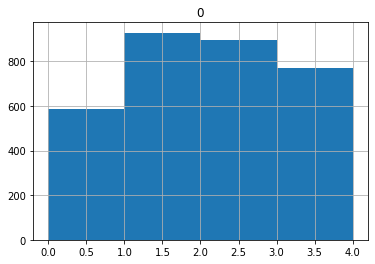

In [25]:
counts.hist(bins=4)

<IPython.core.display.Javascript object>


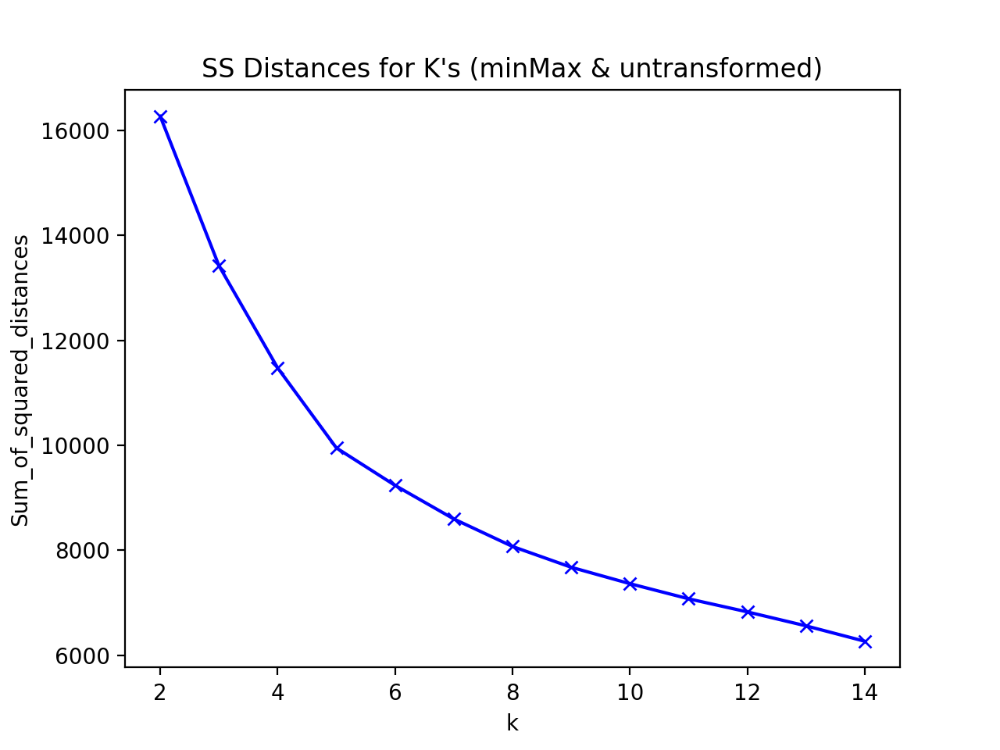

In [26]:
%matplotlib notebook

import matplotlib.pyplot as plt
from sklearn import cluster

Sum_of_squared_distances = []
K = range(2,15)
for k in K:
    kmeans = cluster.KMeans(n_clusters=k, random_state=124)
    kmeans = kmeans.fit(data)
    Sum_of_squared_distances.append(kmeans.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title("SS Distances for K's (minMax & untransformed)")
plt.show()

In [27]:
n_clusters = 5
kmeans_minMax_log_best = cluster.KMeans(n_clusters=n_clusters, random_state=124)
kmeans_minMax_log_best = kmeans_minMax_log_best.fit(data)

In [28]:
minMaxLabelsLogBest = kmeans_minMax_log_best.labels_

In [29]:
minMaxLabelBreakdownLogBest = pd.DataFrame(minMaxLabelsLogBest, columns=['cluster'])
minMaxLabelBreakdownLogBest.cluster = minMaxLabelBreakdownLogBest.cluster+1

In [30]:
minMaxLabelsLogBest_with_redelivery = pd.concat([minMaxLabelBreakdownLogBest.reset_index(drop=True), laterDatePercTrimmed.reset_index(drop=True)], axis=1)

NameError: name 'laterDatePercTrimmed' is not defined

In [31]:
minMaxLabelBreakdownLogBest = minMaxLabelBreakdownLogBest.groupby('cluster').size().to_frame('size').reset_index()

In [32]:
minMax_centers_logBest = kmeans_minMax_log_best.cluster_centers_.transpose()

In [33]:
import matplotlib.ticker

def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw={}, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (N, M).
    row_labels
        A list or array of length N with the labels for the rows.
    col_labels
        A list or array of length M with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if not ax:
        ax = plt.gca()

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)

    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)
    cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # We want to show all ticks...
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_yticks(np.arange(data.shape[0]))
    # ... and label them with the respective list entries.
    ax.set_xticklabels(col_labels)
    ax.set_yticklabels(row_labels)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")

    # Turn spines off and create white grid.
    for edge, spine in ax.spines.items():
        spine.set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='', linewidth=-1)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar


def annotate_heatmap(im, data=None, valfmt="{x:.2f}",
                     textcolors=["black", "white"],
                     threshold=None, **textkw):
    """
    A function to annotate a heatmap.

    Parameters
    ----------
    im
        The AxesImage to be labeled.
    data
        Data used to annotate.  If None, the image's data is used.  Optional.
    valfmt
        The format of the annotations inside the heatmap.  This should either
        use the string format method, e.g. "$ {x:.2f}", or be a
        `matplotlib.ticker.Formatter`.  Optional.
    textcolors
        A list or array of two color specifications.  The first is used for
        values below a threshold, the second for those above.  Optional.
    threshold
        Value in data units according to which the colors from textcolors are
        applied.  If None (the default) uses the middle of the colormap as
        separation.  Optional.
    **kwargs
        All other arguments are forwarded to each call to `text` used to create
        the text labels.
    """

    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)

    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            kw.update(color=textcolors[int(im.norm(data[i, j]) > threshold)])
            text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            texts.append(text)

    return texts

<IPython.core.display.Javascript object>


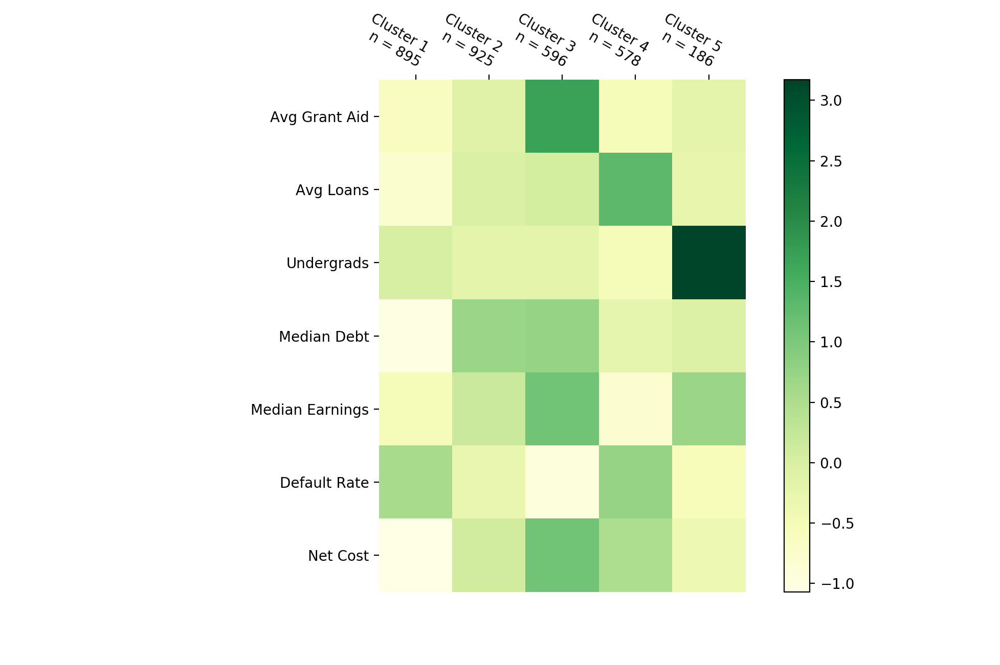

(<matplotlib.image.AxesImage at 0x1a1c28ad68>,
 <matplotlib.colorbar.Colorbar at 0x1a1c0e8240>)

In [35]:

fig, ax = plt.subplots()


column_names = ['Cluster '+str(num+1)+'\nn = ' +str(minMaxLabelBreakdownLogBest.iloc[num,1])  for num in range(n_clusters)]
row_names = ["Avg Grant Aid", "Avg Loans", "Undergrads", "Median Debt", "Median Earnings", "Default Rate", "Net Cost"]


heatmap(minMax_centers_logBest, row_labels=row_names, col_labels=column_names, cmap="YlGn")



In [125]:
sc['cluster'] = kmeans_minMax_log_best.labels_
sc['GRAD_DEBT_MDN_SUPP'] = sc['GRAD_DEBT_MDN_SUPP'].astype(float)
sc['CDR3'] = sc['CDR3'].astype(float)
sc['MD_EARN_WNE_P10'] = sc['MD_EARN_WNE_P10'].astype(float)
sc['Average amount of federal  state  local or institutional grant aid awarded (SFA1516)']

<IPython.core.display.Javascript object>


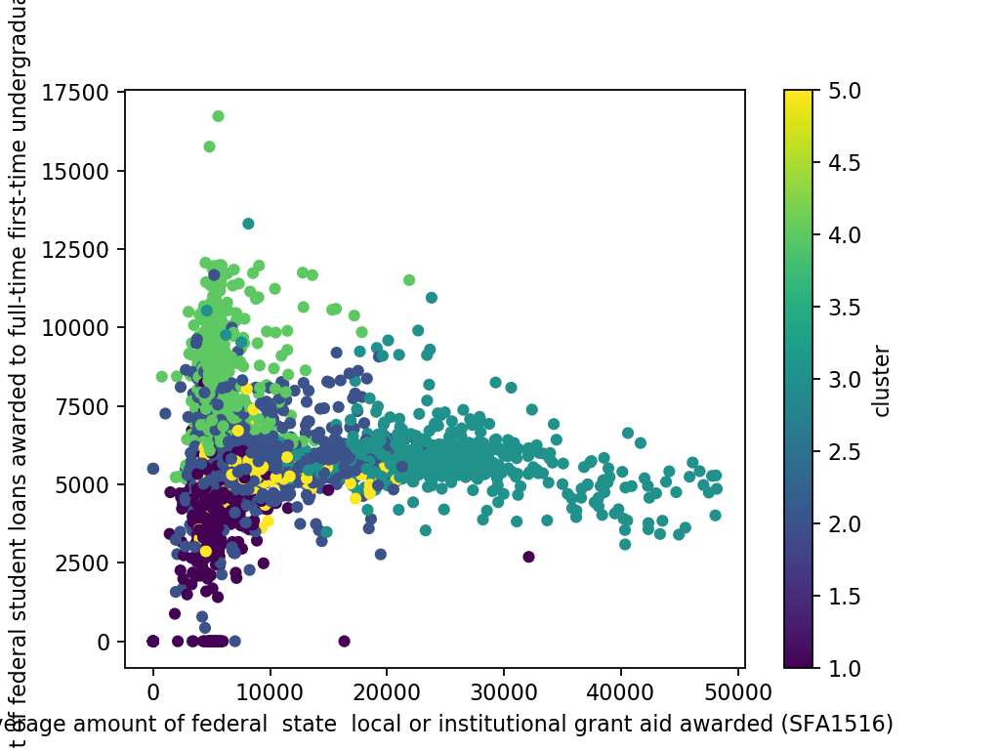

In [150]:
ax2 = sc.plot.scatter(x='Average amount of federal  state  local or institutional grant aid awarded (SFA1516)',
                       y='Average amount of federal student loans awarded to full-time first-time undergraduates (SFA1516)',
                       c='cluster',
                       colormap='viridis')

In [145]:
output = sc.drop(['UNITID_x', 'UNITID_y'], axis=1).sort_values('UGDS',ascending=False)

In [146]:
output.to_csv("CollegeClusters.csv")

In [149]:
sc


,UnitID,Institution Name,City location of institution (HD2016),State abbreviation (HD2016),Total amount of federal state local or institutional grant aid awarded to full-time first-time undergraduates (SFA1516),Average amount of federal state local or institutional grant aid awarded (SFA1516),Total amount of federal student loans awarded to full-time first-time undergraduates (SFA1516),Average amount of federal student loans awarded to full-time first-time undergraduates (SFA1516),Total amount of federal state local or institutional grant aid received by full-time first-time undergraduates (SFA0809),Average amount of federal state local or institutional grant aid received (SFA0809),Total amount of Federal student loan aid received by full-time first-time undergraduates (SFA0809),Average amount of federal student loan aid received by full-time first-time undergraduates (SFA0809),UNITID_x,UGDS,GRAD_DEBT_MDN_SUPP,MD_EARN_WNE_P10,PCTFLOAN,UNITID_y,RPY_1YR_RT,RPY_3YR_RT,CDR2,CDR3,Full-time retention rate 2016 (EF2016D),Published in-state tuition and fees 2017-18 (IC2017_AY),Total price for in-state students living off campus (not with family) 2017-18 (DRVIC2017),Total price for in-state students living off campus (not with family) 2008-09 (DRVIC2008),Grand total (GR2016 Bachelor's or equiv subcohort (4-yr institution) CALCULATED GRADUATION RATE),net cost,cluster
1,222178,Abilene Christian University,Abilene,TX,18761445.0,17550.0,3414378.0,5758.0,8673739.0,9267.0,4575973.0,7717.0,222178,3655.0,23628.0,43000.0,0.5266,222178,0.6505410567,0.693627451,0.050,0.085,76.0,33330.0,48300.0,0.0,62.5,26037.0,3
2,138558,Abraham Baldwin Agricultural College,Tifton,GA,3731762.0,4790.0,2356007.0,4919.0,3592674.0,4232.0,2533538.0,4500.0,138558,3185.0,14681.5,32900.0,0.4184,138558,0.3493506494,0.4206349206,0.093,0.179,64.0,3503.0,13803.0,13791.0,31.7,8251.0,1
3,172866,Academy College,Bloomington,MN,19354.0,9677.0,24500.0,8167.0,44470.0,2965.0,82167.0,5478.0,172866,56.0,24216.0,33500.0,0.5000,172866,0.2943925234,0.4135802469,0.198,0.277,100.0,17661.0,36902.0,33108.0,0.0,0.0,4
4,412173,Academy for Nursing and Health Occupations,West Palm Beach,FL,114041.0,4224.0,195376.0,7236.0,1678826.0,4115.0,2488200.0,7800.0,412173,408.0,14853.0,38500.0,0.5744,412173,0.1538461538,0.2251308901,0.039,0.038,100.0,0.0,0.0,0.0,0.0,20571.0,2
5,108232,Academy of Art University,San Francisco,CA,1733856.0,8417.0,1505344.0,5702.0,1539018.0,5988.0,2595466.0,5351.0,108232,7520.0,35688.0,38600.0,0.4718,108232,0.2842558622,0.3836150845,0.109,0.140,71.0,21252.0,40750.0,34696.0,37.2,33012.0,2
6,439969,Acupuncture and Massage College,Miami,FL,31478.0,3935.0,47989.0,6856.0,96669.0,3718.0,413635.0,10606.0,439969,37.0,7600.0,24500.0,0.6429,439969,0.3739837398,0.4329896907,0.029,0.193,83.0,10765.0,37991.0,29940.0,0.0,20324.0,4
7,126182,Adams State University,Alamosa,CO,3077721.0,7562.0,1520090.0,5915.0,2538880.0,6238.0,1351979.0,4989.0,126182,1876.0,22500.0,35200.0,0.5539,126182,0.3872714963,0.4125932063,0.072,0.157,61.0,9440.0,24597.0,0.0,28.8,13742.0,2
8,188429,Adelphi University,Garden City,NY,15296967.0,19487.0,3031523.0,6149.0,10197524.0,12125.0,2150365.0,3525.0,188429,5162.0,25000.0,58500.0,0.5841,188429,0.6380813953,0.6921578178,0.033,0.059,83.0,37170.0,56358.0,36240.0,68.2,28322.0,3
9,188438,Adirondack Community College,Queensbury,NY,3056976.0,5086.0,1788850.0,4888.0,1705723.0,3325.0,1019930.0,4322.0,188438,3034.0,12000.0,31900.0,0.5379,188438,0.4077901431,0.462657614,0.111,0.198,60.0,5119.0,20394.0,13452.0,0.0,7642.0,1
10,168528,Adrian College,Adrian,MI,11352937.0,22843.0,2899871.0,6118.0,7248896.0,14946.0,1726898.0,4680.0,168528,1609.0,27000.0,38600.0,0.8929,168528,0.6038863976,0.6611226611,0.044,0.100,69.0,36010.0,52074.0,0.0,53.0,27209.0,3
